In [3]:
"""This is video reader with all operations inside fnctions, so they can be called on 
    each frame out of a set of frames, and each video out of a set of videos
    """

'This is video reader with all operations inside fnctions, so they can be called on \n    each frame out of a set of frames, and each video out of a set of videos\n    '

In [4]:
"""Imports"""
import matplotlib.pyplot as plt #for maknig plots inside the notebook
import skimage
import skvideo.io
from skimage import measure, morphology
from skimage.filters import threshold_yen, threshold_isodata, threshold_triangle, threshold_li
from skimage.util import invert
from scipy import ndimage
from operator import attrgetter
import numpy as np
import math
from itertools import chain
from glob import glob
#import antigravity

In [5]:
"""Functions"""
"USING THRESHOLD LI"
# read in a file, save the video sequence
def full_avi(filename):
    Vid = skvideo.io.vread(filename)

    fig, ax = plt.subplots(ncols=2)
    ax[0].imshow(Vid[0]) # first fame of video
    ax[1].imshow(Vid[-1]) #last frame of video

    print("Video shape is: ", Vid.shape)
    print("Video length is: ", len(Vid))
    
    return Vid

# take a read video; makeit a 2D matrix
def greens(framelist):
    green = framelist[:, :, :, 2]
    #print("This is the green channel of the image")
    #print("The slice shape is: ", green.shape)
    #plt.imshow(green[1], cmap='Greys_r')
    return green


# apply total thresholding to each of a list of frames; filter slides with wrong number
def total_threshold_filter(framelist, indes):
    # returns a new list, different from the orginal
    fll = len(framelist)
    f_indices = []
    f_ap = f_indices.append
    threshed_images = []
    t_ap = threshed_images.append
    m_lab = measure.label
    m_rop = measure.regionprops
    
    sides = {"t":[], "c":[], "ucf":[]}
    classes = {"t":[], "c":[], "ucf":[]}
    
    for i in range(fll):
       # print("new_frame")
        frame = framelist[i]
        thresh_img = frame > threshold_li(frame) # binary image
        img_labelled = m_lab(thresh_img) # contains connected regions
        properties_list = m_rop(img_labelled, coordinates = 'rc') # data about regions, for each connected region
        
        #----------getting maximum connected region----------
        biggest_r = max(properties_list, key = attrgetter('area'))
        biggest_r = m_rop(morphology.dilation(morphology.closing(m_lab(biggest_r.filled_image))), coordinates='rc')[0]
        """ for k in range(len(properties_list)):
            if areas[k] > biggest_area:
                biggest_r = properties_list[k]
            else:
                pass"""

        #----------------------filter------------------------- can use actual filter
        area_threshold = 1850   # must have enough particles
        sol_threshold = 0.95
        iner_threshold = (320, 410)
        convex_thresholds = (2000, 2800)   # convex hull area (> 2500 filtered)  # particles must be in parallelogram
        minor_thresholds = (38, 48) # minor_axis length (< filterd) # particles must be in parallelogram
        #major_thresholds = (59, 76)
        major_threshold = 78
        #inertia_thresholds = (355, 455)
        #ecc_threshold = .88
        test = (biggest_r.area > area_threshold
               #and biggest_r.major_axis_length < major_threshold # must then be well-formed
               )
        
        if test: # keep frames that have enough paricles, and are not transitions
            if (biggest_r.inertia_tensor[0, 0] + biggest_r.inertia_tensor[1,1] > iner_threshold[0]
                and biggest_r.inertia_tensor[0, 0] + biggest_r.inertia_tensor[1,1] < iner_threshold[1]):
                f_ap(i) # image's index 
                i_threshed = frame > threshold_isodata(frame)
                img2_labelled = m_lab(i_threshed)
                properties2_list = m_rop(img2_labelled)
                biggest_r2 = max(properties2_list, key = attrgetter('area'))
                t_ap((img_labelled, img2_labelled))
                #-----------------------------classify pt 1---------------------------------------
                coprod = coord_prod(thresh_img, i_threshed)
                side = sideify(biggest_r2)
                clas = side#classify(side, -coprod)
                sides[side].append((frame, (img_labelled, img2_labelled), tf + indes[i]))
                classes[clas].append((frame, (img_labelled, img2_labelled), tf + indes[i]))
            
    filtrate = framelist[f_indices]
    return [[(filtrate[i], threshed_images[i], indes[i]) for i in range(len(filtrate))], sides, classes]



        
# take largest isodata image region, and return aclassification
def sideify(idir):
    iner = idir.inertia_tensor[0, 0] + idir.inertia_tensor[1, 1]
    maal = idir.major_axis_length
    mial = idir.minor_axis_length
    sol = idir.solidity 
    ecc = idir.eccentricity
    cva = idir.convex_area
    area = idir.area
    if area < 1280:
        return "ucf"
    elif ecc <= 0.7 and  mial > 41:
        return "t"
    elif ecc > 0.8 and ecc < 0.91 and maal > 66.5 and maal < 74: # maal > 67.5 and or (mial < 41 and maal > 65): # it's on top
        return "c"
    else:
        return "ucf"

def classify(side, coprod):
    if side == "t":
        if coprod > 0:
            return "tl"
        else:
            return "tr"
    elif side == "b": 
        if coprod > 0:
            return "br"
        else:
            return "bl"
    elif side == "bm":
        return "bm"
    elif side == "ucf":
        return "ucf"
    else:
        return "newt"


def coord_prod(thresh_y, thresh_i):
    m_rop = measure.regionprops
    for i in range(0, 1):#len(fl):
        one_and_some = thresh_y ^ thresh_i
        full_rs_props = m_rop(measure.label(thresh_y))
        one_rs_props = m_rop(measure.label(one_and_some))
        biggest_full_props = max(full_rs_props, key = attrgetter('area'))
        biggest_one_props = max(one_rs_props, key = attrgetter('area'))
        full_com = biggest_full_props.centroid
        one_com = biggest_one_props.centroid
        orien = biggest_full_props.orientation
        #print(full_com, one_com, orien)
        
        rel_one_com = (one_com[0] - full_com[0], one_com[1] - full_com[1])
        oriented_rel_one_com = rotate_point(rel_one_com, -orien)
        product = oriented_rel_one_com[0]*oriented_rel_one_com[1]
        #print(rel_one_com, product)
        return product
        
    

def rotate_point(point, angle):
    x0 = point[0]
    y0 = point[1]
    x1 = x0*np.cos(angle) - y0*np.sin(angle)
    y1 = x0*np.sin(angle) + y0*np.cos(angle)
    return (x1, y1)

    """else:
        side = side(region)
        x, y = get_x,y
        if x * y > 0:
            if side == 'right':
                return 'tl'
            else:
                return 'br'
        else:
            if side == 'right':
                return 'tr'
            else:
                return 'bl'"""    
# if solidity <= .76 and inertia > 400 => bm
# elif inertia >=355 and mal >= 63 => tl/tr
# elif inertia <= 355 and mal <= 63 => bl/br
# else unclassifiable

        
#from pair of labelled, thresholded images, return an image category (of three)

#from pair of labelled,thresholded images, return the x/y sign or x/y magnitude for the transparent dot

#from two above measuremens, in larger function, take a frame and pair of thresholded images, and return the frame and the shape


./tchakamau/New_setup\test5_new_frames.avi
Video shape is:  (26797, 256, 256, 3)
Video length is:  26797


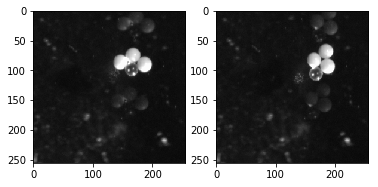

In [6]:
"""Pipeline for videos:"""
# initialize frame list
#filename2 = glob("./tchakamau/New_setup/unstable*.avi")[0]#"./tchakamau/New_setup/45701_10Vpp_18_tester.avi"
filename = glob("./tchakamau/New_setup/test5*.avi")[0]#glob("./tchakamau/New_setup/Multiple*.avi")[0]
print(filename)
frame_vid = full_avi(filename) # making videos ino a frame list
#frame_vid_2 = full_avi(filename2) # making videos ino a frame list
#frame_vid = trans_runs= np.load('shape_testing.npy')[0]
#print(frame_vid)

#-----------------------------------------------------------------------



In [7]:
tf = 13268
h = list(range(0, len(frame_vid), int(len(frame_vid)/300)))
print(len(h))

302


(302, 256, 256, 3)


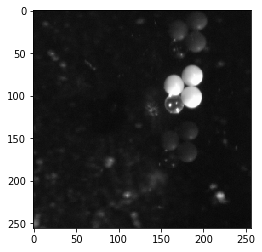

In [8]:
framelist = frame_vid[h]#np.concatenate((frame_vid, frame_vid_2))#np.concatenate((frame_vid[l], frame_vid_2[l2]))# will be replaced by full video
plt.imshow(framelist[-1])
print(framelist.shape)

In [9]:
"""Pipeline for lists of frames"""
"""And test thereof (using isinar)"""
def piped(framelist, h):
    # key variable to be passed into the function is framelist
    green_frames = greens(framelist) # making a green slice
    filtered_frames = total_threshold_filter(green_frames, h)
    return filtered_frames

def isinar(a, als):
    #print(a)
    y = False
    for ele in als:
        #print(ele)
        y = np.array_equal(ele, a)
        if y:
            return y
        else: 
            continue
    return y

org = piped(framelist, h)
twf = org[0]
sids = org[1]
cls = org[2]
print("unfiltered ", len(framelist))
print("filtered ", len(twf))
print("length of sides ", len([x for y in sids.values() for x in y]))
print("length of classes ", len([x for y in cls.values() for x in y]))
filts = [j[ :, :, 2] for j in framelist if not isinar(j[:, :, 2], [k[0] for k in twf] )] #jnot in [k[0] for k in twf]]
print("length of filtered out slides ", len(filts))

print("length of side classifs ", [[x, len(sids[x])] for x in sids])
print("lengths of each classes classif ", [[x, len(cls[x])] for x in cls])

c:\programdata\miniconda3\lib\site-packages\skimage\measure\_regionprops.py:250: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See http://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)
c:\programdata\miniconda3\lib\site-packages\skimage\measure\_regionprops.py:260: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See http://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)


unfiltered  302
filtered  67
length of sides  67
length of classes  67
length of filtered out slides  235
length of side classifs  [['t', 6], ['c', 40], ['ucf', 21]]
lengths of each classes classif  [['t', 6], ['c', 40], ['ucf', 21]]


c:\programdata\miniconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


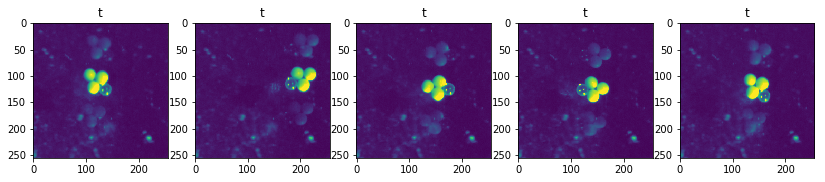

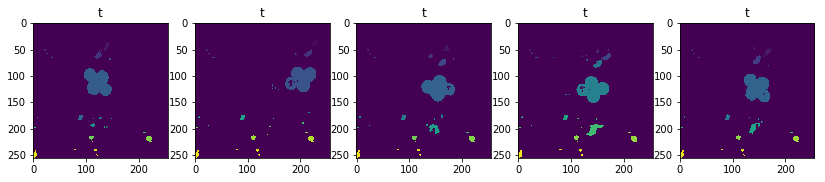

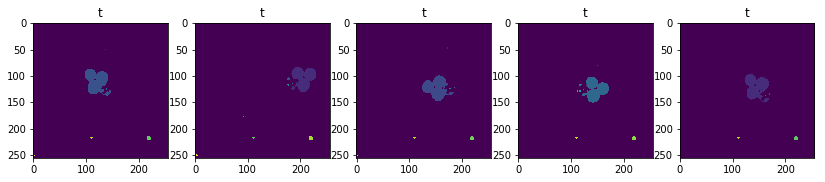

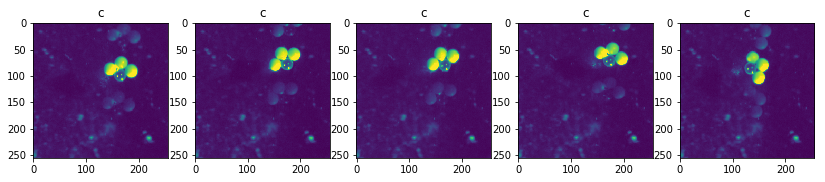

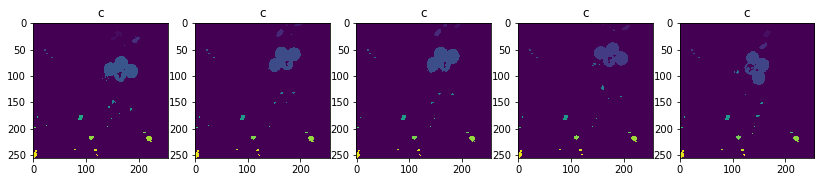

...

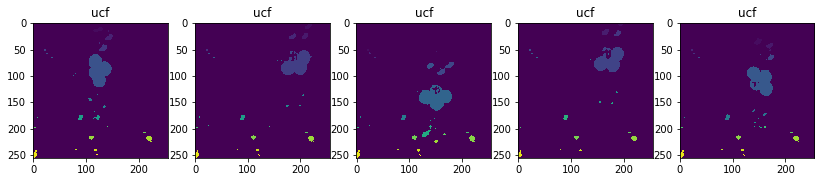

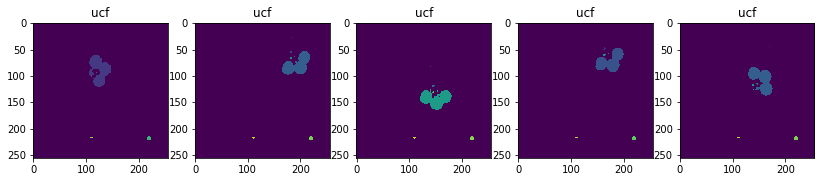

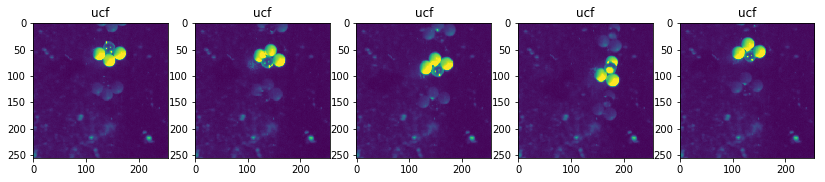

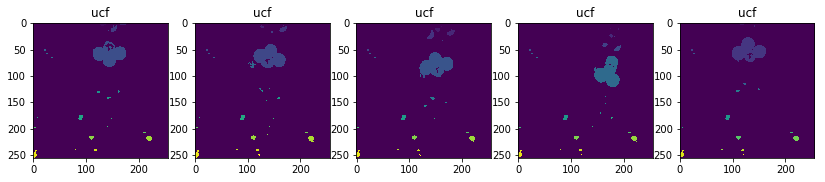

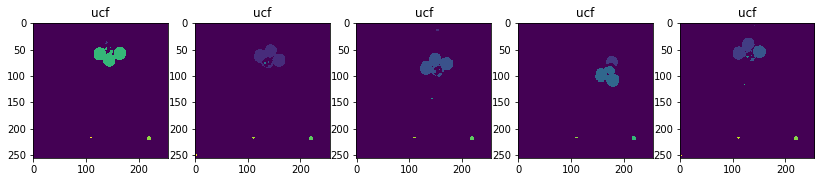

In [10]:
"""Visualizethe classifiedobjects"""
for key in sids.keys():
    vals = sids[key]
    frames = [val[0] for val in vals]
    threshes =  [val[1] for val in vals]
    c =5
    r = int(len(vals)/ c)
    for j in range(r):
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            frame = frames[j * c + k]
            ax[k].set_title(key)
            ax[k].imshow(frame)
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            lab = threshes[j * c + k]
            ax[k].set_title(key)
            ax[k].imshow(lab[0])
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            lab = threshes[j * c + k]
            ax[k].set_title(key)
            ax[k].imshow(lab[1])
    
    

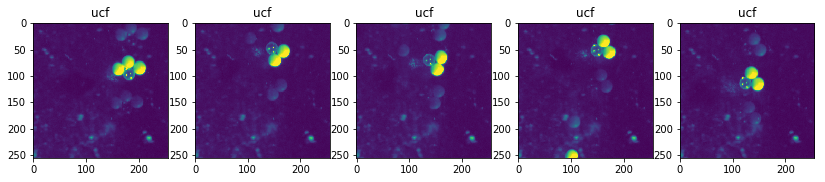

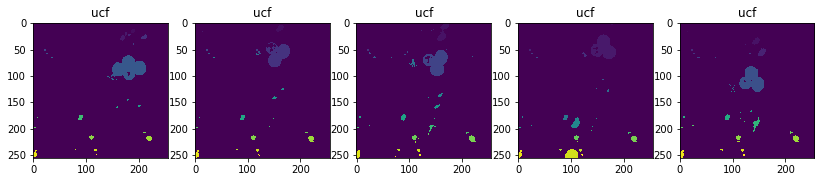

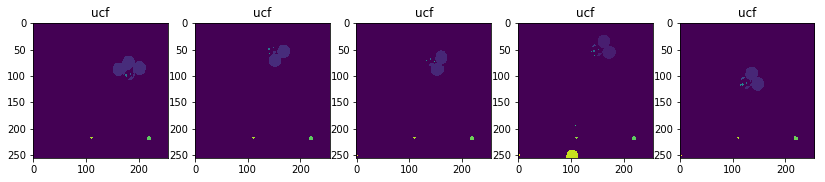

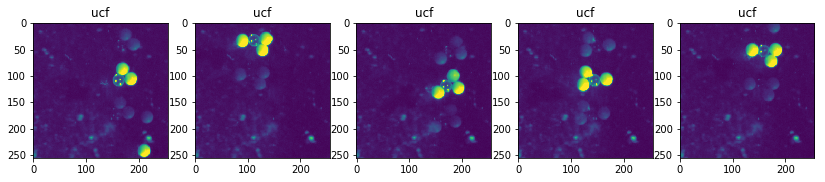

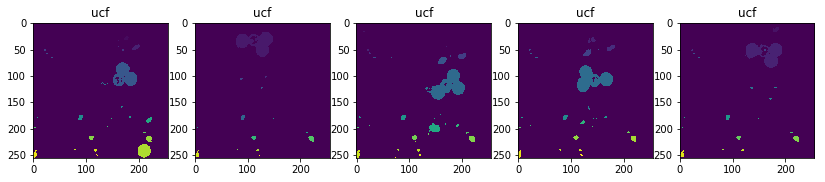

...

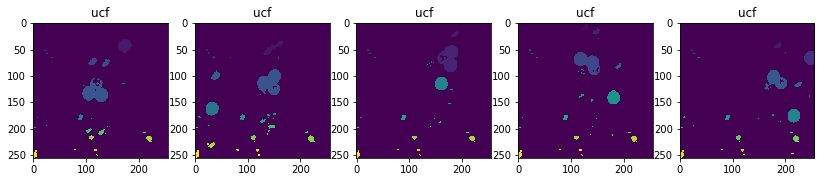

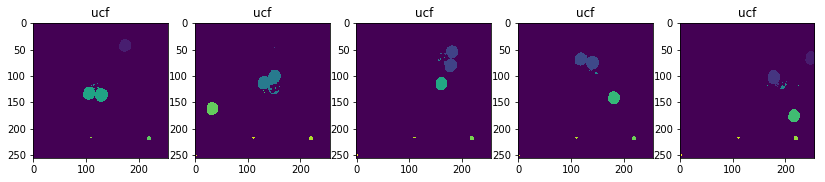

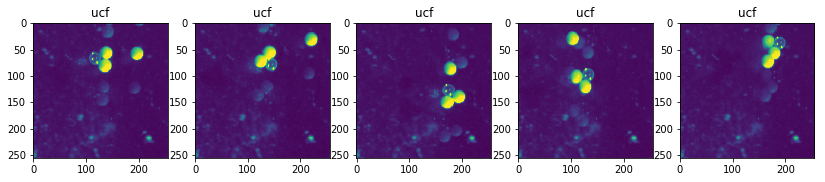

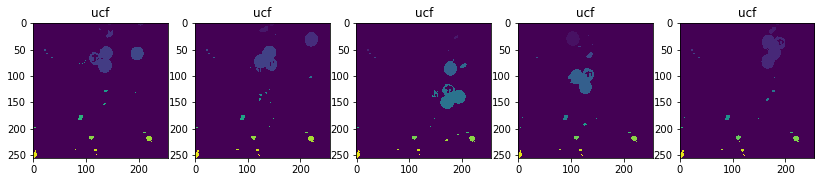

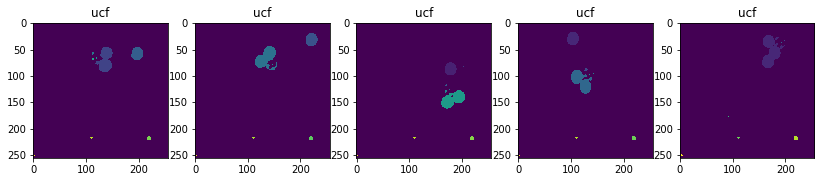

In [11]:
"""Visualizethe filtered objects"""

frames = filts
c = 5
r = int(len(filts)/ c)
for j in range(r):
    fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
    for k in range(c):
        frame = frames[j * c + k]
        ax[k].set_title(key)
        ax[k].imshow(frame)
    fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
    for k in range(c):
        frame = frames[j * c + k]
        ax[k].set_title(key)
        ax[k].imshow(measure.label(frame > threshold_li(frame)))
    fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
    for k in range(c):
        frame = frames[j * c + k]
        ax[k].set_title(key)
        ax[k].imshow(measure.label(frame > threshold_isodata(frame)))

In [12]:
frams = framelist
filtered_len = len(twf)

print("unfiltered ", len(frams))
print("filtered ", filtered_len)
#filts = [j[ :, :, 2] for j in framelist if not isinar(j[:, :, 2], [k[0] for k in twf] )] #jnot in [k[0] for k in twf]]
#print("length of filtered out slides ", len(filts))
skeys = list(sids.keys())
print ('skeys', skeys)
ckeys = list(cls.keys())
print ('ckeys', ckeys)
slcs = [len(sids[x]) for x in skeys]
clcs = [len(cls[x]) for x in ckeys]
ucf = len(sids["ucf"])
print(slcs, clcs)
print("length of side classifs ", [[skeys[i], slcs[i], '%.2f' %(slcs[i] *100/ filtered_len)] for i in range(len(skeys))])
print("lengths of each classes classif ", [[ckeys[i], clcs[i], "%.2f" %(clcs[i] *100/ filtered_len)] for i in range(len(ckeys))])

unfiltered  302
filtered  67
skeys ['t', 'c', 'ucf']
ckeys ['t', 'c', 'ucf']
[6, 40, 21] [6, 40, 21]
length of side classifs  [['t', 6, '8.96'], ['c', 40, '59.70'], ['ucf', 21, '31.34']]
lengths of each classes classif  [['t', 6, '8.96'], ['c', 40, '59.70'], ['ucf', 21, '31.34']]


In [13]:
def region_selector(labeled_image, label):
    #print(label)
    x = labeled_image == label
    #plt.imshow(x)
    return x

# make a function that takes a set of labeled regions, and then  returns a boolean array containing only the largest
def largest_region_extractor(labeled_regions_set):
    props_lists = measure.regionprops(labeled_regions_set)
    #print(len(labeled_regions_set), len(props_lists))
    biggest_r_p = props_lists[0]
    biggest_r_label = props_lists[0].label
    for i in range(0, len(props_lists)):
        pli = props_lists[i]
        if pli.area > biggest_r_p.area:
            biggest_r_p = pli
            biggest_r_label = pli.label
        else:
            pass
    return region_selector(labeled_regions_set, biggest_r_label)
def get_transparent_dot(framelist, threshes_labeled):
    ones = []
    for i in range(len(framelist)):
        frame = framelist[i] 
        threshes = threshes_labeled[i]
        i_threshed  = threshes[1]
        y_threshed  = threshes[0]
        full = largest_region_extractor(y_threshed)
        four = largest_region_extractor(i_threshed)
        one_and_some = full^four
        ones.append(largest_region_extractor(measure.label(one_and_some)))
        
        
        """fig, ax = plt.subplots(ncols = 2)
        ax[0].imshow(one_and_some)
        ax[1].imshow(one)
        #print(one_and_some)
        #print(one)
        plt.show()"""
        
    return ones # A LIST WITH, FOR EACH FRAME, 

'for i in range(0, len(framesets[0:5])):\n    fl = [x[0] for x in filtrates[i]]\n    ft = [x[1] for x in filtrates[i]]\n    ones = get_transparent_dot(fl, ft)\n    twf = ones[0:5]\n    c = 5\n    r = len(twf)// c\n    for j in range(r):\n        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))\n        #fig.set_title(framesetnames[i])\n        for k in range(c):\n            ax[k].set_title(ft[j * c + k])\n            ax[k].imshow(fl[j * c + k])\n        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))\n        #fig.set_title(framesetnames[i])\n        for k in range(c):\n            ax[k].set_title(twf[j * c + k][1])\n            ax[k].imshow(twf[j * c + k][0])\nprint("\n\n")'

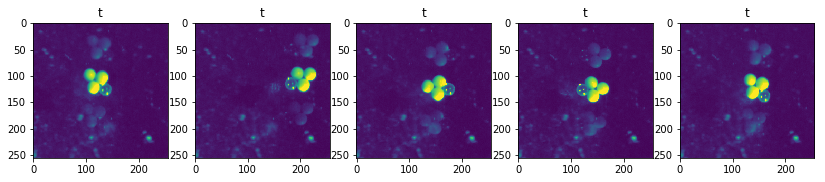

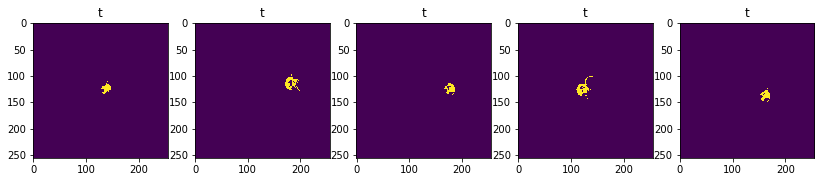

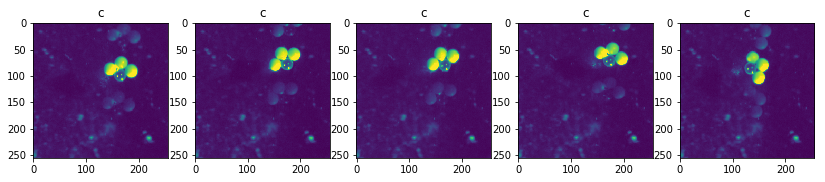

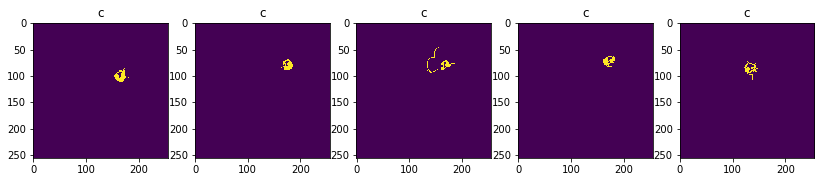

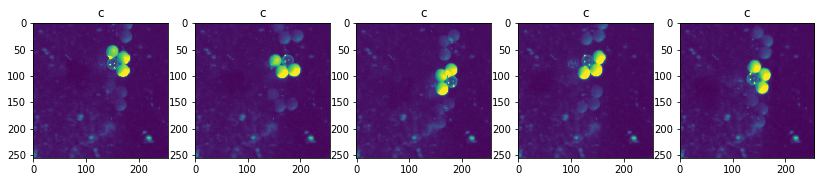

...

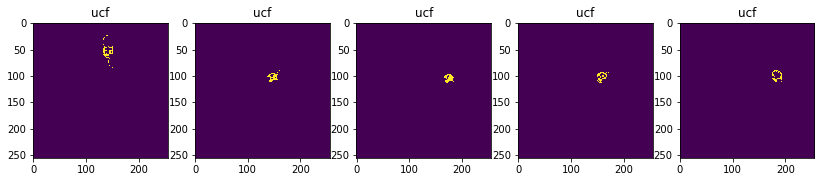

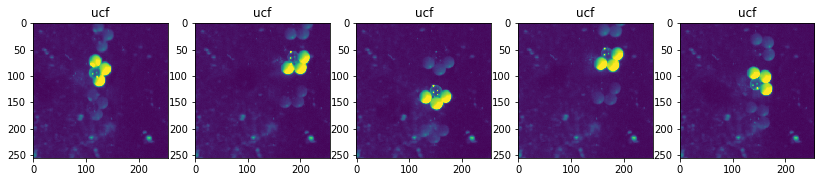

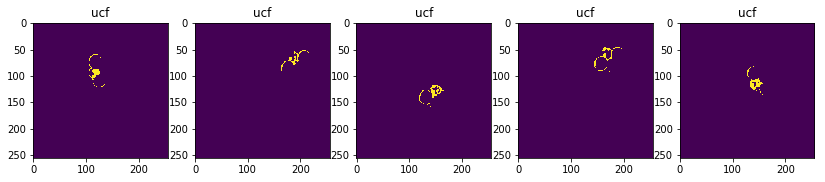

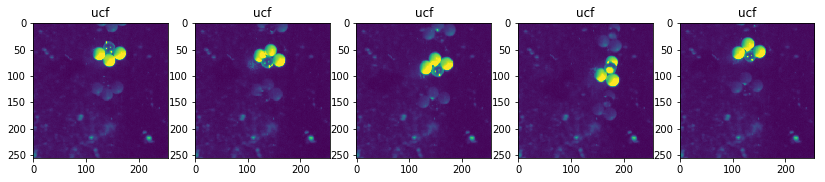

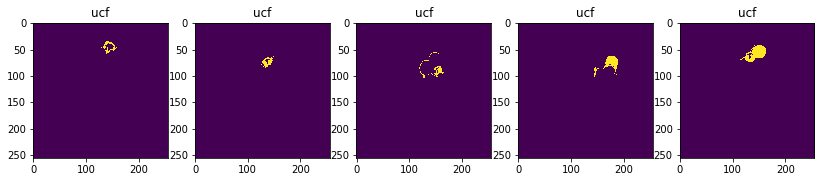

In [14]:
"""OBSERVE THAT DOTS ARE PRINTED RIGHT TO GET BEARINGS"""
#print dots
for key in sids.keys():
    vals = sids[key]
    frames = [val[0] for val in vals]
    threshes =  [val[1] for val in vals]
    ones = get_transparent_dot(frames, threshes)
    c = 5
    r = int(len(vals)/ c)
    for j in range(r):
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            frame = frames[j * c + k]
            ax[k].set_title(key)
            ax[k].imshow(frame)
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            dot = ones[j * c + k]
            ax[k].set_title(key)
            ax[k].imshow(dot)
"""for i in range(0, len(framesets[0:5])):
    fl = [x[0] for x in filtrates[i]]
    ft = [x[1] for x in filtrates[i]]
    ones = get_transparent_dot(fl, ft)
    twf = ones[0:5]
    c = 5
    r = len(twf)// c
    for j in range(r):
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        #fig.set_title(framesetnames[i])
        for k in range(c):
            ax[k].set_title(ft[j * c + k])
            ax[k].imshow(fl[j * c + k])
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        #fig.set_title(framesetnames[i])
        for k in range(c):
            ax[k].set_title(twf[j * c + k][1])
            ax[k].imshow(twf[j * c + k][0])
print("\n\n")"""

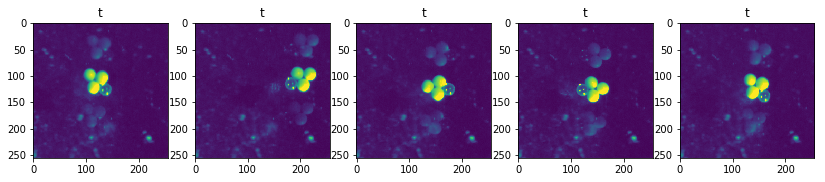

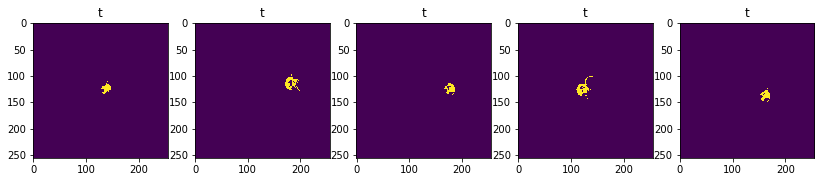

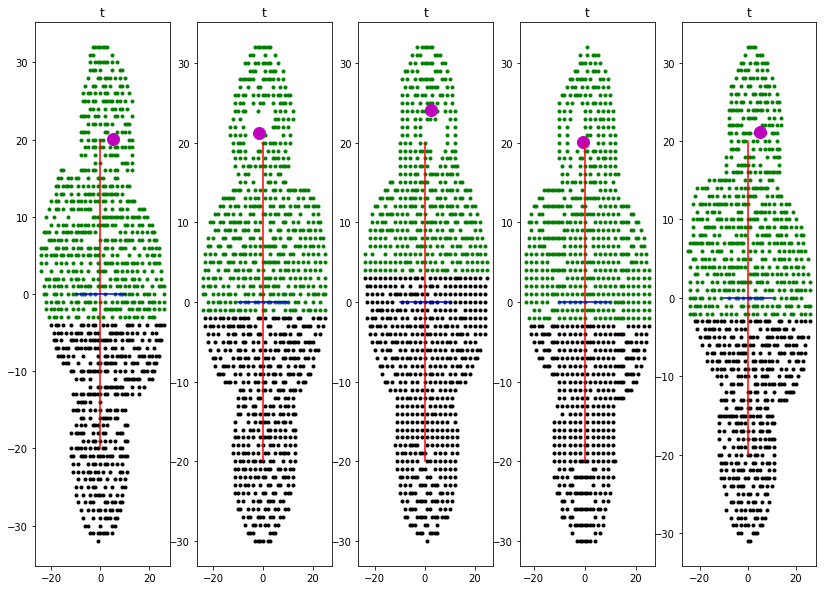

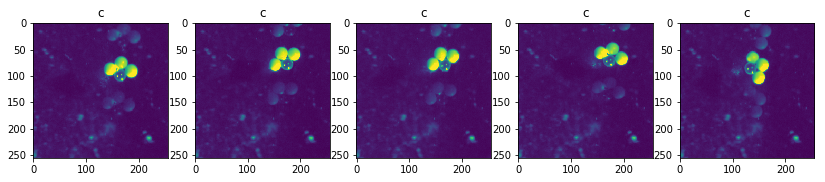

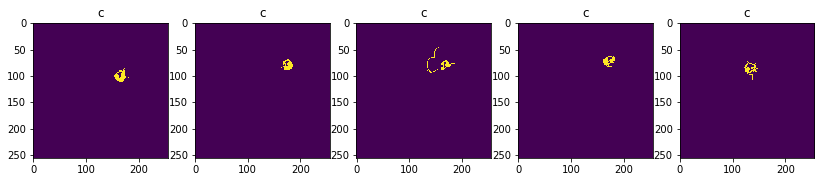

...

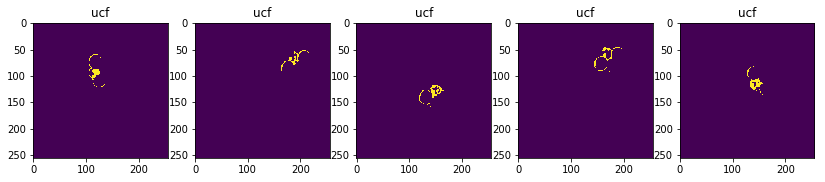

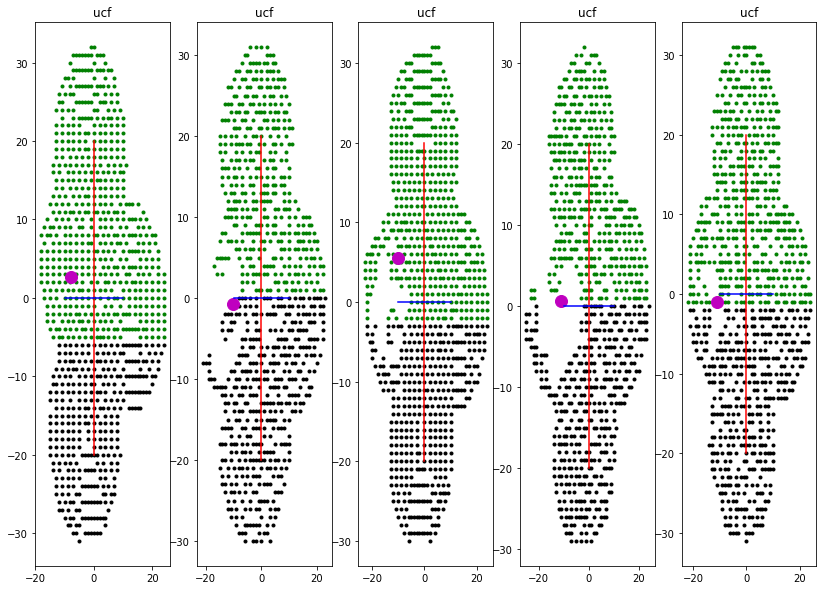

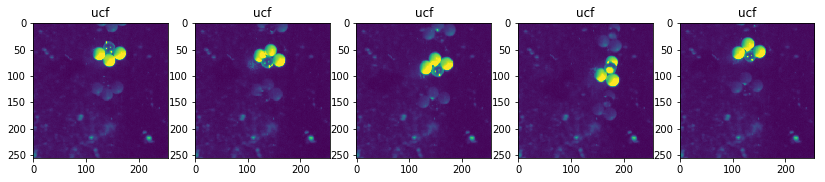

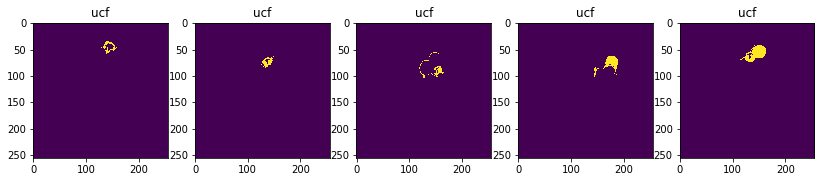

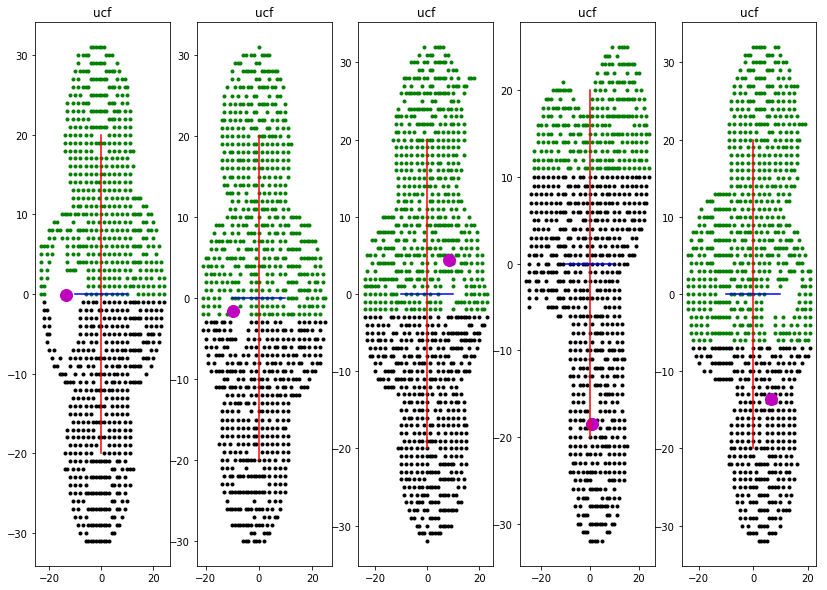

In [15]:
m_rop = measure.regionprops
morph_hull = morphology.convex_hull_image
ave = np.average
for key in sids.keys():
    vals = sids[key]
    frames = [val[0] for val in vals]
    threshes =  [val[1] for val in vals]
    ones = get_transparent_dot(frames, threshes)
    c = 5
    r = int(len(vals)/ c)
    for j in range(r):
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            frame = frames[j * c + k]
            ax[k].imshow(frame)
            ax[k].set_title(key)
        plt.show()
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            frame = frames[j * c + k] 
            lab = threshes[j * c + k]
            full = largest_region_extractor(lab[0])
            four = largest_region_extractor(lab[1])
            full_or = m_rop(full.astype(int), coordinates = 'rc')[0].orientation
            one_and_some = full^four
            one = largest_region_extractor(measure.label(one_and_some))
            ax[k].imshow(one)
            ax[k].set_title(key)
        plt.show()
        fig, ax = plt.subplots(ncols=c, figsize = (14, 10))
        for k in range(c):
            frame = frames[j * c + k] 
            lab = threshes[j * c + k]
            full = largest_region_extractor(lab[0])
            four = largest_region_extractor(lab[1])
            full_or = m_rop(full.astype(int), coordinates = 'rc')[0].orientation
            one_and_some = full^four
            one = largest_region_extractor(measure.label(one_and_some))
            rotated_one = ndimage.rotate(one, math.degrees(-full_or), reshape = False)
            rotated_full = ndimage.rotate(full, math.degrees(-full_or), reshape = False)
            geo_cent = m_rop(rotated_full.astype(int), coordinates = 'rc')[0].centroid#m_rop(rotated_full.astype(int), coordinates = 'rc')[0].bbox
            #print(geo_cent)

            cent_x = int(geo_cent[1])#int(ave([geo_cent[1], geo_cent[3]]) )
            cent_y = int(geo_cent[0])#int(ave([geo_cent[0], geo_cent[2]]))
            #print(cent_x, cent_y)

            one_com = m_rop(rotated_one.astype(int))[0].centroid

            rel_com_one = (one_com[1] - cent_x, one_com[0] - cent_y) # vector of com of the dot relative to geometric center
            #print("com of dot relative geo_cent", rel_com_one, np.prod(rel_com_one))
            
            #----------
            #----------
            min_vec = (1, 0)
            maj_vec = (0, 1)

            raw_coords = (m_rop(rotated_full.astype(int), coordinates = 'rc')[0].coords).T
            ys = raw_coords[0]
            #print(m_rop(rotated_full.astype(int), coordinates = 'rc')[0].coords)
            xs = raw_coords[1]
            thresh_for_middle = [ys[i] for i in range(len(ys)) if xs[i] == max(xs) ][0]
            xt =[(xs - cent_x)[i] for i in range(len(xs - cent_x)) if ys[i] > thresh_for_middle] 
            yt = [(ys - cent_y)[i] for i in range(len(ys-cent_y)) if ys[i] > thresh_for_middle] 
            xb =[(xs - cent_x)[i] for i in range(len(xs - cent_x)) if ys[i] <= thresh_for_middle] 
            yb = [(ys - cent_y)[i] for i in range(len(ys-cent_y)) if ys[i] <= thresh_for_middle] 
            top = np.zeros((256, 256))
            top[yt, xt] = 1
            bottom = np.zeros((256, 256))
            bottom[np.asarray([yb, xb]).T] = 1
            ecc_dif = m_rop(measure.label(top), coordinates = 'rc')[0].eccentricity - m_rop(measure.label(bottom), coordinates = 'rc')[0].eccentricity            
            tlength = m_rop(measure.label(top), coordinates = 'rc')[0].bbox[0] - m_rop(measure.label(top), coordinates = 'rc')[0].bbox[2]          
            blength = m_rop(measure.label(bottom), coordinates = 'rc')[0].bbox[0] - m_rop(measure.label(bottom), coordinates = 'rc')[0].bbox[2]  
            len_dif = tlength-blength
            scale = 10
            #plt.plot( np.nonzero(c_hull)[1]- ave(xs),  np.nonzero(c_hull)[0] - ave(ys),'y.')
            ax[k].plot(xt, yt, 'k.', color = 'green')
            ax[k].plot(xb, yb, 'k.')
            ax[k].plot(rel_com_one[0], rel_com_one[1], 'mo', ms=12)
            ax[k].plot([maj_vec[0]*-scale*2, maj_vec[0]*scale*2],
                     [maj_vec[1]*-scale*2, maj_vec[1]*scale*2], color='red')
            ax[k].plot([min_vec[0]*-scale, min_vec[0]*scale],
                     [min_vec[1]*-scale, min_vec[1]*scale], color='blue')
            ax[k].set_title(key)
        #plt.gca().invert_yaxis()  # Match the image system with origin at top left
        plt.show()